In [1]:
# importing required libraries 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [8]:
# Loading the dataset

train_X = pd.read_csv(r'C:\Users\Saloni\OneDrive\Desktop\data science ppt\suvesh sir ppt\UCI HAR Dataset\train\X_train.txt',header=None, delim_whitespace=True)
train_y = pd.read_csv(r'C:\Users\Saloni\OneDrive\Desktop\data science ppt\suvesh sir ppt\UCI HAR Dataset\train\y_train.txt',header=None, delim_whitespace=True)

test_X = pd.read_csv(r'C:\Users\Saloni\OneDrive\Desktop\data science ppt\suvesh sir ppt\UCI HAR Dataset\test\X_test.txt',header=None, delim_whitespace=True)
test_y = pd.read_csv(r'C:\Users\Saloni\OneDrive\Desktop\data science ppt\suvesh sir ppt\UCI HAR Dataset\test\y_test.txt',header=None, delim_whitespace=True)

In [9]:
# Reading data of train_X
train_X.head()

,0,1,2,3,4,5,6,7,8,9,...,551,552,553,554,555,556,557,558,559,560
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.074323,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,0.158075,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,0.414503,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,0.404573,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,0.087753,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892


In [10]:
# Mergeing a data to a single dataframe
# first we 
x_merge = pd.concat([train_X, test_X], axis = 0).reset_index(drop = True)    # independent variable
y_merge = pd.concat([train_y, test_y], axis = 0).reset_index(drop = True)    # dependent variable

In [11]:
x_merge.head()

,0,1,2,3,4,5,6,7,8,9,...,551,552,553,554,555,556,557,558,559,560
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.074323,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,0.158075,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,0.414503,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,0.404573,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,0.087753,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892


In [12]:
# adding columns name

feature_names = ['feature_'+ str(i) for i in range(x_merge.shape[1])]

In [13]:
x_merge.columns = feature_names

In [14]:
x_merge.head()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_551,feature_552,feature_553,feature_554,feature_555,feature_556,feature_557,feature_558,feature_559,feature_560
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.074323,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,0.158075,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,0.414503,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,0.404573,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,0.087753,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892


In [15]:
y_merge.columns = ['label']
y_merge

,label
0,5
1,5
2,5
3,5
4,5
...,...
10294,2
10295,2
10296,2
10297,2


In [16]:
UCI = pd.concat([x_merge, y_merge], axis = 1)

In [17]:
# Reading top 5 rows of the dataset.
UCI.head()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_552,feature_553,feature_554,feature_555,feature_556,feature_557,feature_558,feature_559,feature_560,label
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627,5
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317,5
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118,5
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663,5
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892,5


In [18]:
# Statistical Information of the Numeric Attributes
UCI.describe()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_552,feature_553,feature_554,feature_555,feature_556,feature_557,feature_558,feature_559,feature_560,label
count,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,...,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000
mean,0.274347,-0.017743,-0.108925,-0.607784,-0.510191,-0.613064,-0.633593,-0.525697,-0.614989,-0.466732,...,-0.298592,-0.617700,0.007705,0.002648,0.017683,-0.009219,-0.496522,0.063255,-0.054284,3.624624
std,0.067628,0.037128,0.053033,0.438694,0.500240,0.403657,0.413333,0.484201,0.399034,0.538707,...,0.320199,0.308796,0.336591,0.447364,0.616188,0.484770,0.511158,0.305468,0.268898,1.743695
min,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,1.000000
25%,0.262625,-0.024902,-0.121019,-0.992360,-0.976990,-0.979137,-0.993293,-0.977017,-0.979064,-0.935788,...,-0.536174,-0.841847,-0.124694,-0.287031,-0.493108,-0.389041,-0.817288,0.002151,-0.131880,2.000000
50%,0.277174,-0.017162,-0.108596,-0.943030,-0.835032,-0.850773,-0.948244,-0.843670,-0.845068,-0.874825,...,-0.335160,-0.703402,0.008146,0.007668,0.017192,-0.007186,-0.715631,0.182028,-0.003882,4.000000
75%,0.288354,-0.010625,-0.097589,-0.250293,-0.057336,-0.278737,-0.302033,-0.087405,-0.288149,-0.014641,...,-0.113167,-0.487981,0.149005,0.291490,0.536137,0.365996,-0.521503,0.250790,0.102970,5.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,6.000000


In [19]:
# looking for missing value:
UCI.isnull().sum()

feature_0      0
feature_1      0
feature_2      0
feature_3      0
feature_4      0
              ..
feature_557    0
feature_558    0
feature_559    0
feature_560    0
label          0
Length: 562, dtype: int64

as we can see above, there is no missing value in this dataset.

### Now find the outlier.

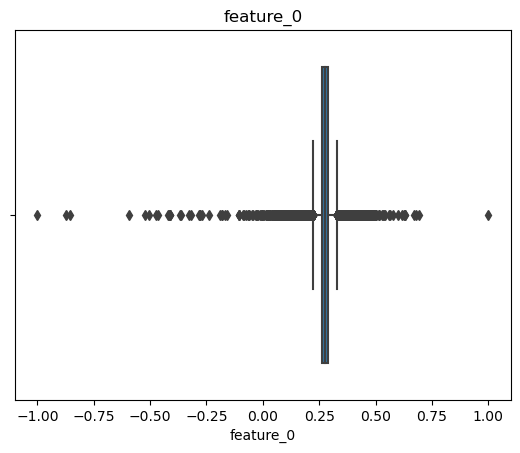

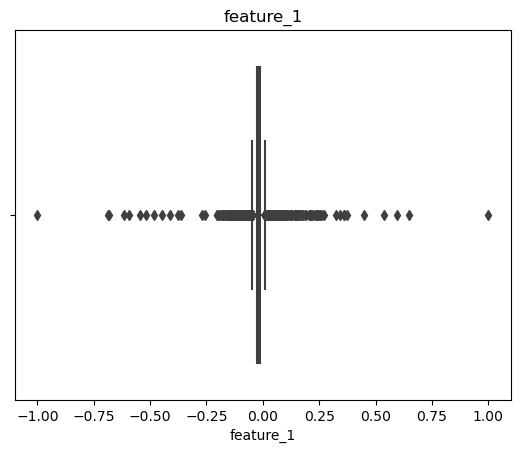

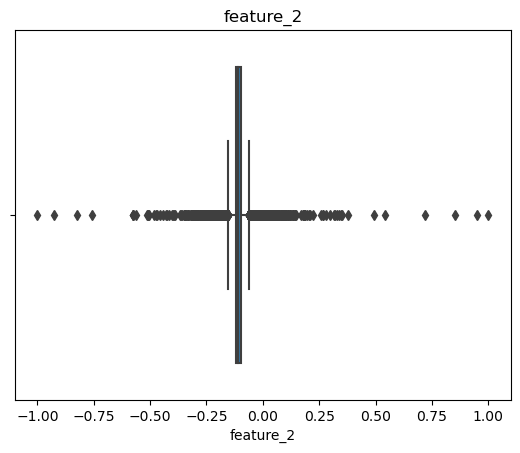

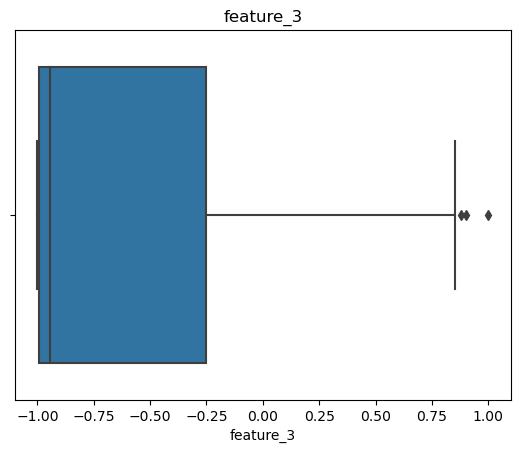

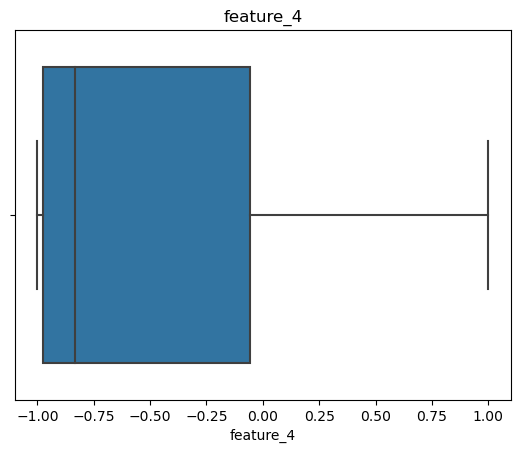

...

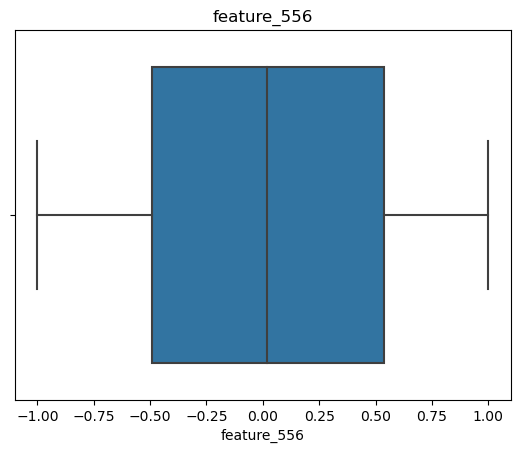

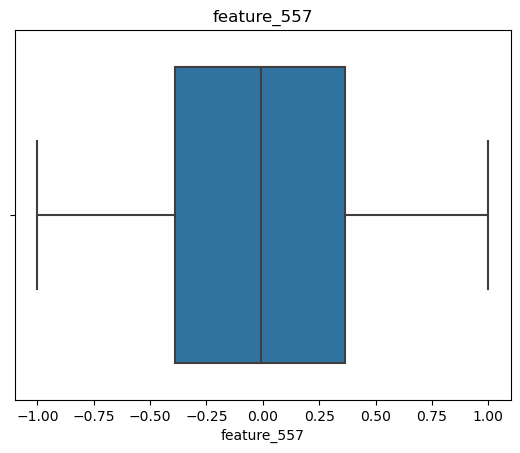

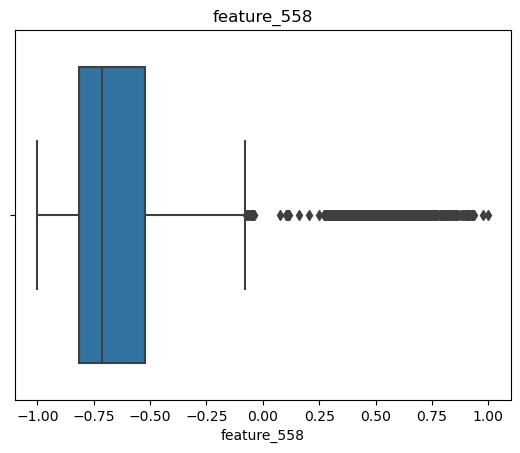

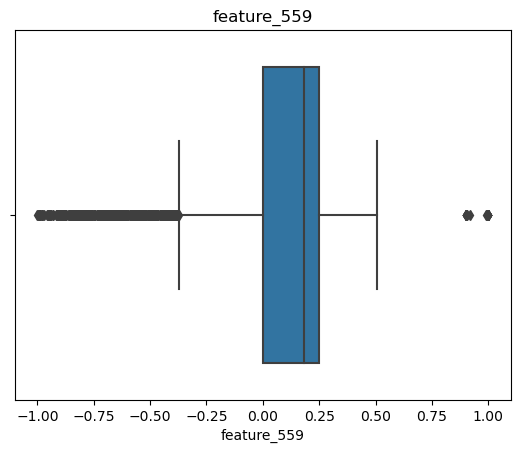

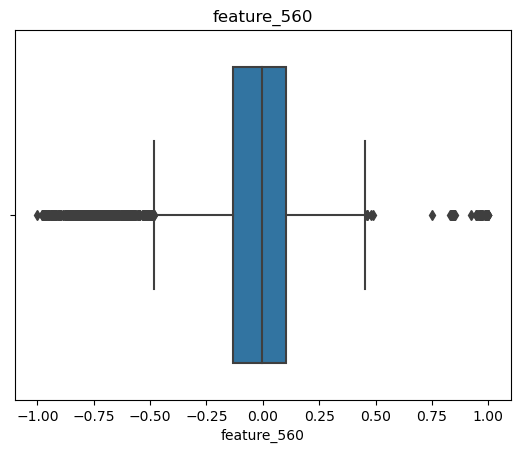

In [20]:
# looking for the outliers

for cols in UCI.columns[:-1]:
    plt.figure()
    sns.boxplot(x = UCI[cols])
    plt.title(f'{cols}')
plt.show()

In [21]:
# making a copy of original dataset
new_UCI = UCI.copy()

In [22]:
new_UCI.head()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_552,feature_553,feature_554,feature_555,feature_556,feature_557,feature_558,feature_559,feature_560,label
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627,5
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317,5
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118,5
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663,5
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892,5


In [23]:
# removing outliers

for cols in new_UCI.columns[:-1]:
    new_UCI[cols] = new_UCI[cols].clip(lower = new_UCI[cols].quantile(0.15), upper = new_UCI[cols].quantile(0.85))

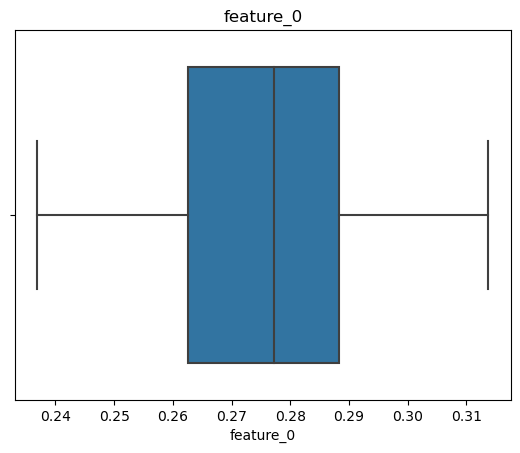

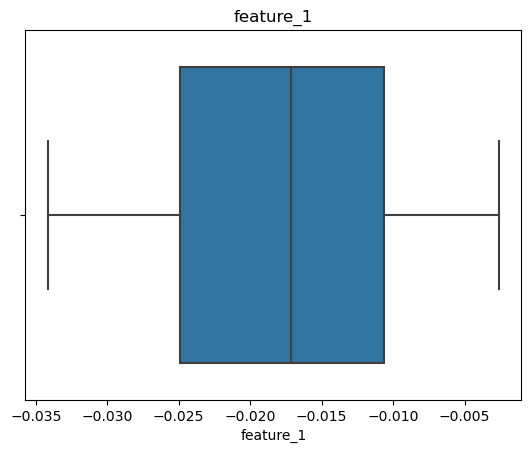

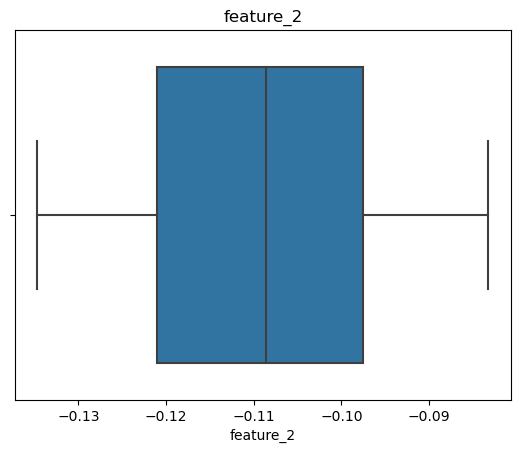

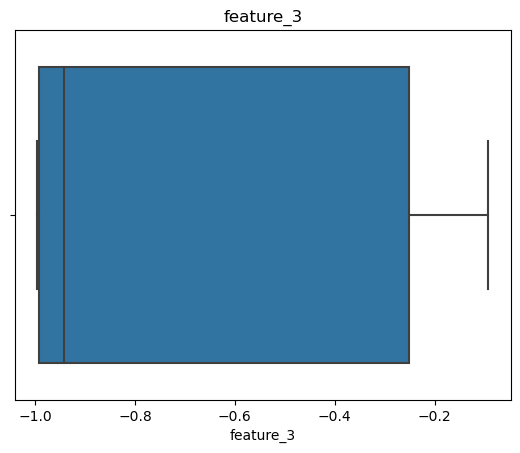

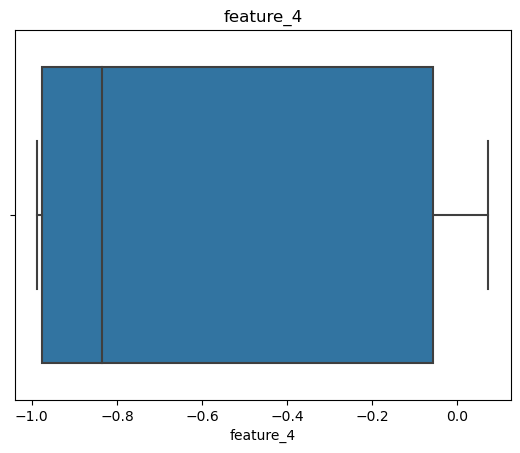

...

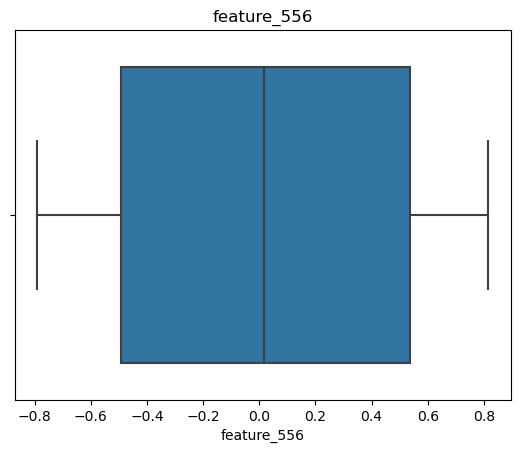

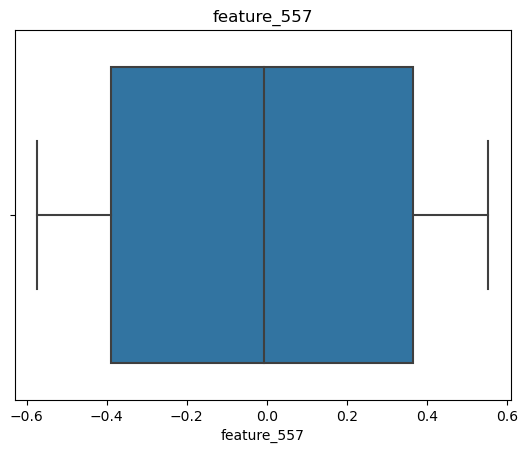

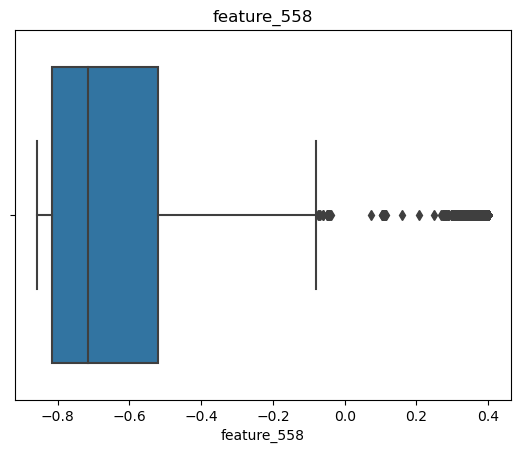

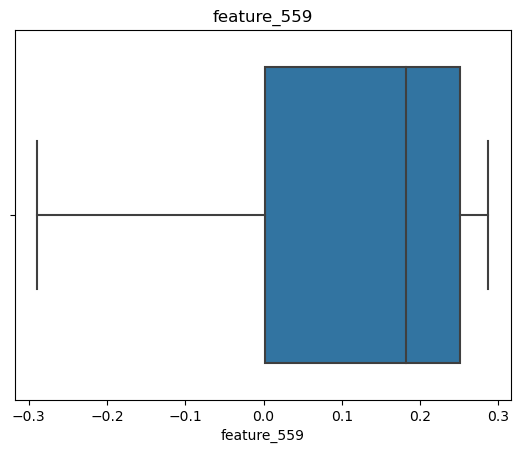

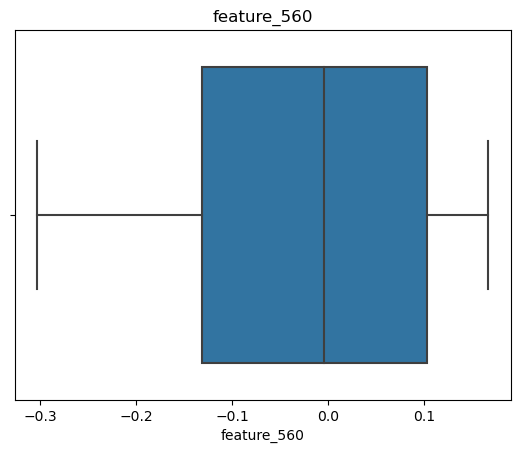

In [24]:

for i in new_UCI.columns[:-1]:
    plt.figure()
    sns.boxplot(x = new_UCI[i])
    plt.title(f'{i}')
plt.show()
    

Outlier removal done successfully.

### Now checking  for the Imbalance data.

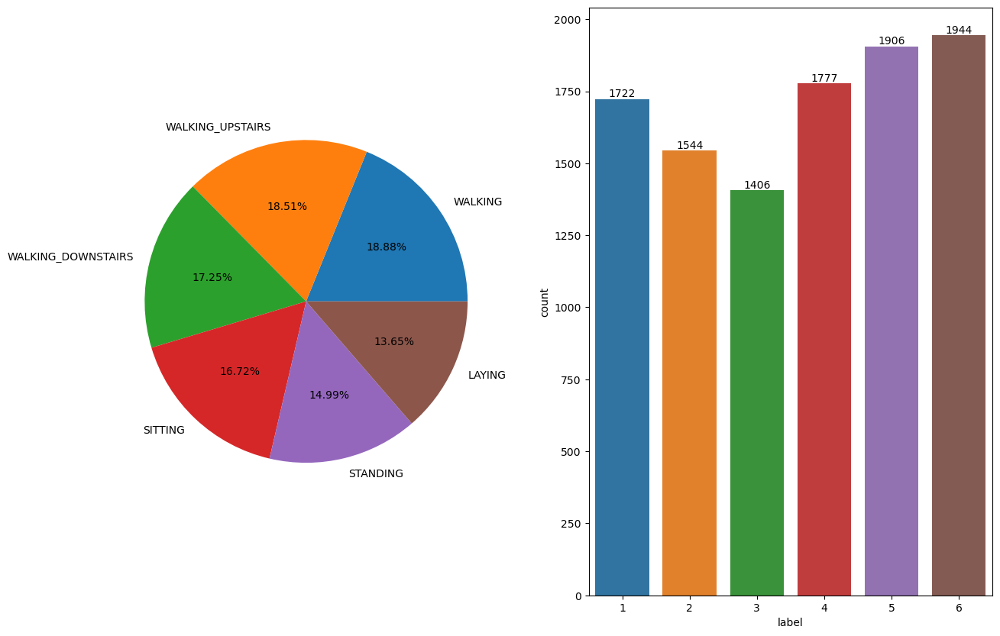

In [25]:


#labels =  (1: WALKING,2: WALKING_UPSTAIRS, 3: WALKING_DOWNSTAIRS, 4: SITTING, 5: STANDING, 6: LAYING)

x = new_UCI['label'].value_counts()
plt.figure(figsize = (15,10))
plt.subplot(1,2,1)
plt.pie(x, autopct='%.2f%%', labels=['WALKING', 'WALKING_UPSTAIRS', 'WALKING_DOWNSTAIRS', 'SITTING', 'STANDING', 'LAYING'])
plt.subplot(1,2,2)
ax = sns.countplot(new_UCI['label'])
for bars in ax.containers:
    ax.bar_label(bars)
plt.show()



##### As we can see in the above graph, our dataset is look like a balance data

In [26]:
# lets select the independent and dependent variable

x = new_UCI.iloc[:,:-1]          # independent 
y = new_UCI['label']             # dependent

### Split and Training data

In [27]:
# spliting the data
from sklearn.model_selection import train_test_split

In [28]:
X_train, X_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=0)

In [29]:
X_train.shape, X_test.shape

((8239, 561), (2060, 561))

In [30]:
y_train.shape, y_test.shape

((8239,), (2060,))

## Logistic Regression

In [31]:
# Model building 
from sklearn.linear_model import LogisticRegression

In [32]:
lr = LogisticRegression()

In [33]:
lr.fit(X_train, y_train)

LogisticRegression()

In [34]:
pred = lr.predict(X_test)

In [35]:
pred

array([4, 3, 6, ..., 4, 2, 2], dtype=int64)

In [36]:
from sklearn.metrics import accuracy_score

In [37]:
acc = accuracy_score(pred, y_test)

In [38]:
acc

0.9776699029126213

# KNN (K-Nearest Neighbors)

In [39]:
from sklearn.neighbors import KNeighborsClassifier

In [40]:
knn = KNeighborsClassifier()

In [41]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [42]:
pred1 = knn.predict(X_test)

In [43]:
pred1

array([4, 3, 6, ..., 4, 2, 2], dtype=int64)

In [44]:
from sklearn.metrics import classification_report, confusion_matrix

In [45]:
confusion_matrix(pred1,y_test)

array([[334,   1,   1,   0,   0,   0],
       [  0, 313,   4,   0,   0,   0],
       [  1,   2, 273,   0,   0,   0],
       [  0,   0,   0, 335,  24,   1],
       [  0,   0,   0,  29, 366,   0],
       [  0,   0,   0,   0,   0, 376]], dtype=int64)

In [46]:
print(classification_report(pred1, y_test))

              precision    recall  f1-score   support

           1       1.00      0.99      1.00       336
           2       0.99      0.99      0.99       317
           3       0.98      0.99      0.99       276
           4       0.92      0.93      0.93       360
           5       0.94      0.93      0.93       395
           6       1.00      1.00      1.00       376

    accuracy                           0.97      2060
   macro avg       0.97      0.97      0.97      2060
weighted avg       0.97      0.97      0.97      2060



In [47]:
acc1 = accuracy_score(pred1, y_test)

In [48]:
acc1

0.9694174757281553

In [49]:
# Choosing k-value:

error_rate = []
for i in range(1,40):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    predict = knn.predict(X_test)
    error = np.mean(predict!=y_test)
    error_rate.append(error)

In [50]:
error_rate

[0.03349514563106796,
 0.0441747572815534,
 0.031067961165048542,
 0.03640776699029126,
 0.03058252427184466,
 0.03300970873786408,
 0.029611650485436892,
 0.0383495145631068,
 0.032524271844660196,
 0.0354368932038835,
 0.03446601941747573,
 0.040776699029126215,
 0.0383495145631068,
 0.04174757281553398,
 0.03932038834951456,
 0.0412621359223301,
 0.039805825242718446,
 0.04514563106796116,
 0.04174757281553398,
 0.04174757281553398,
 0.0412621359223301,
 0.0441747572815534,
 0.04563106796116505,
 0.04951456310679612,
 0.04757281553398058,
 0.048058252427184464,
 0.048058252427184464,
 0.05048543689320388,
 0.04951456310679612,
 0.05,
 0.04951456310679612,
 0.050970873786407765,
 0.050970873786407765,
 0.05145631067961165,
 0.04902912621359223,
 0.05145631067961165,
 0.05,
 0.05145631067961165,
 0.051941747572815535]

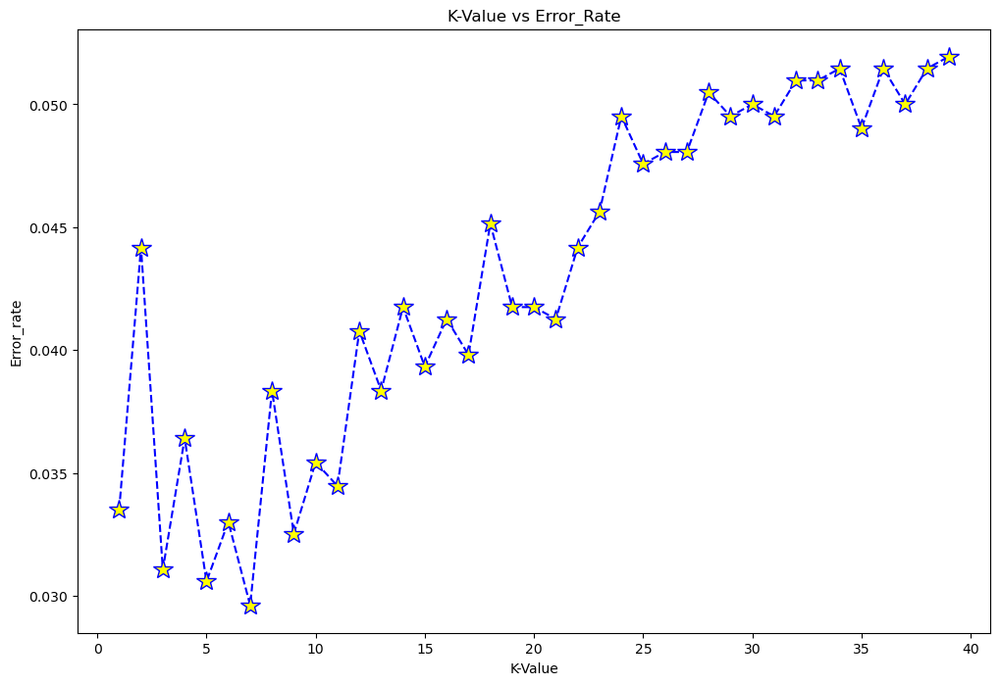

In [51]:
# K-Value vs Error_Rate

plt.figure(figsize = (12,8))
plt.plot(range(1,40), error_rate, linestyle = 'dashed', marker = '*', markersize = 15, markerfacecolor = 'yellow', c = 'b')
plt.title('K-Value vs Error_Rate')
plt.xlabel('K-Value')
plt.ylabel('Error_rate')
plt.show()


In [52]:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train,y_train)
pred2 = knn.predict(X_test)
print("With K = 1")
print()
print("Confusion matrix:\n\n ",confusion_matrix(pred2,y_test))
print()
print("Classification Report\n\n",classification_report(pred2, y_test))

With K = 1

Confusion matrix:

  [[334   0   5   0   0   0]
 [  0 316   2   0   0   0]
 [  1   0 271   0   0   0]
 [  0   0   0 332  28   1]
 [  0   0   0  31 362   0]
 [  0   0   0   1   0 376]]

Classification Report

               precision    recall  f1-score   support

           1       1.00      0.99      0.99       339
           2       1.00      0.99      1.00       318
           3       0.97      1.00      0.99       272
           4       0.91      0.92      0.92       361
           5       0.93      0.92      0.92       393
           6       1.00      1.00      1.00       377

    accuracy                           0.97      2060
   macro avg       0.97      0.97      0.97      2060
weighted avg       0.97      0.97      0.97      2060



In [53]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train,y_train)
pred2 = knn.predict(X_test)
print("With K = 5")
print("Confusion matrix: \n\n ",confusion_matrix(pred2,y_test))
print()
print("Classification Report\n\n",classification_report(pred2, y_test))

With K = 5
Confusion matrix: 

  [[334   1   1   0   0   0]
 [  0 313   4   0   0   0]
 [  1   2 273   0   0   0]
 [  0   0   0 335  24   1]
 [  0   0   0  29 366   0]
 [  0   0   0   0   0 376]]

Classification Report

               precision    recall  f1-score   support

           1       1.00      0.99      1.00       336
           2       0.99      0.99      0.99       317
           3       0.98      0.99      0.99       276
           4       0.92      0.93      0.93       360
           5       0.94      0.93      0.93       395
           6       1.00      1.00      1.00       376

    accuracy                           0.97      2060
   macro avg       0.97      0.97      0.97      2060
weighted avg       0.97      0.97      0.97      2060



In [54]:
knn = KNeighborsClassifier(n_neighbors=6)
knn.fit(X_train,y_train)
pred2 = knn.predict(X_test)
print("With K = 6")
print("Confusion matrix:\n\n",confusion_matrix(pred2,y_test))
print()
print("Classification Report:\n\n",classification_report(pred2, y_test))

With K = 6
Confusion matrix:

 [[335   3   1   0   0   0]
 [  0 313   5   0   0   0]
 [  0   0 272   0   0   0]
 [  0   0   0 348  42   1]
 [  0   0   0  16 348   0]
 [  0   0   0   0   0 376]]

Classification Report:

               precision    recall  f1-score   support

           1       1.00      0.99      0.99       339
           2       0.99      0.98      0.99       318
           3       0.98      1.00      0.99       272
           4       0.96      0.89      0.92       391
           5       0.89      0.96      0.92       364
           6       1.00      1.00      1.00       376

    accuracy                           0.97      2060
   macro avg       0.97      0.97      0.97      2060
weighted avg       0.97      0.97      0.97      2060



In [55]:
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(X_train,y_train)
pred2 = knn.predict(X_test)
print("With K = 7")
print("Confusion matrix:\n\n",confusion_matrix(pred2,y_test))
print()
print("Classification Report:\n\n",classification_report(pred2, y_test))

With K = 7
Confusion matrix:

 [[334   1   1   0   0   0]
 [  0 314   4   0   0   0]
 [  1   1 273   0   0   0]
 [  0   0   0 334  22   1]
 [  0   0   0  29 368   0]
 [  0   0   0   1   0 376]]

Classification Report:

               precision    recall  f1-score   support

           1       1.00      0.99      1.00       336
           2       0.99      0.99      0.99       318
           3       0.98      0.99      0.99       275
           4       0.92      0.94      0.93       357
           5       0.94      0.93      0.94       397
           6       1.00      1.00      1.00       377

    accuracy                           0.97      2060
   macro avg       0.97      0.97      0.97      2060
weighted avg       0.97      0.97      0.97      2060



In [56]:
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train,y_train)
pred2 = knn.predict(X_test)
print("With K = 10")
print("Confusion matrix:\n\n",confusion_matrix(pred2,y_test))
print()
print("Classification Report:\n\n",classification_report(pred2, y_test))

With K = 10
Confusion matrix:

 [[335   1   3   0   0   0]
 [  0 315   5   0   0   0]
 [  0   0 270   0   0   0]
 [  0   0   0 337  35   2]
 [  0   0   0  26 355   0]
 [  0   0   0   1   0 375]]

Classification Report:

               precision    recall  f1-score   support

           1       1.00      0.99      0.99       339
           2       1.00      0.98      0.99       320
           3       0.97      1.00      0.99       270
           4       0.93      0.90      0.91       374
           5       0.91      0.93      0.92       381
           6       0.99      1.00      1.00       376

    accuracy                           0.96      2060
   macro avg       0.97      0.97      0.97      2060
weighted avg       0.96      0.96      0.96      2060



In [57]:
knn = KNeighborsClassifier(n_neighbors=11)
knn.fit(X_train,y_train)
pred2 = knn.predict(X_test)
print("With K = 11")
print("Confusion matrix:\n\n ",confusion_matrix(pred2,y_test))
print()
print("Classification Report:\n\n",classification_report(pred2, y_test))

With K = 11
Confusion matrix:

  [[335   2   3   0   0   0]
 [  0 314   4   0   0   0]
 [  0   0 271   0   0   0]
 [  0   0   0 325  21   2]
 [  0   0   0  38 369   0]
 [  0   0   0   1   0 375]]

Classification Report:

               precision    recall  f1-score   support

           1       1.00      0.99      0.99       340
           2       0.99      0.99      0.99       318
           3       0.97      1.00      0.99       271
           4       0.89      0.93      0.91       348
           5       0.95      0.91      0.93       407
           6       0.99      1.00      1.00       376

    accuracy                           0.97      2060
   macro avg       0.97      0.97      0.97      2060
weighted avg       0.97      0.97      0.97      2060



In [58]:
knn = KNeighborsClassifier(n_neighbors=12)
knn.fit(X_train,y_train)
pred2 = knn.predict(X_test)
print("With K = 12")
print("Confusion matrix: \n\n",confusion_matrix(pred2,y_test))
print()
print("Classification Report\n\n",classification_report(pred2, y_test))

With K = 12
Confusion matrix: 

 [[335   2   4   0   0   0]
 [  0 313   6   0   0   0]
 [  0   1 268   0   0   0]
 [  0   0   0 333  38   2]
 [  0   0   0  30 352   0]
 [  0   0   0   1   0 375]]

Classification Report

               precision    recall  f1-score   support

           1       1.00      0.98      0.99       341
           2       0.99      0.98      0.99       319
           3       0.96      1.00      0.98       269
           4       0.91      0.89      0.90       373
           5       0.90      0.92      0.91       382
           6       0.99      1.00      1.00       376

    accuracy                           0.96      2060
   macro avg       0.96      0.96      0.96      2060
weighted avg       0.96      0.96      0.96      2060



In [59]:
knn = KNeighborsClassifier(n_neighbors=13)
knn.fit(X_train,y_train)
pred2 = knn.predict(X_test)
print("With K = 13")
print("Confusion matrix:\n\n",confusion_matrix(pred2,y_test))
print()
print("Classification Report:\n\n",classification_report(pred2, y_test))

With K = 13
Confusion matrix:

 [[334   2   4   0   0   0]
 [  0 312   5   0   0   0]
 [  1   2 269   0   0   0]
 [  0   0   0 327  26   2]
 [  0   0   0  36 364   0]
 [  0   0   0   1   0 375]]

Classification Report:

               precision    recall  f1-score   support

           1       1.00      0.98      0.99       340
           2       0.99      0.98      0.99       317
           3       0.97      0.99      0.98       272
           4       0.90      0.92      0.91       355
           5       0.93      0.91      0.92       400
           6       0.99      1.00      1.00       376

    accuracy                           0.96      2060
   macro avg       0.96      0.96      0.96      2060
weighted avg       0.96      0.96      0.96      2060



## Naive Bayes Algorithm

In [60]:
from sklearn.naive_bayes import GaussianNB

In [61]:
gnb = GaussianNB()

In [62]:
gnb.fit(X_train, y_train)

GaussianNB()

In [63]:
pred3 = gnb.predict(X_test)

In [64]:
pred3

array([4, 3, 6, ..., 4, 2, 2], dtype=int64)

In [65]:
acc3 = accuracy_score(pred3,y_test)

In [66]:
acc3

0.7262135922330097

In [67]:
cm = confusion_matrix(pred3,y_test)

In [68]:
cm

array([[249,   9,  13,   0,   0,   0],
       [ 37, 260,  38,   3,   2,  11],
       [ 49,  47, 227,   0,   0,   0],
       [  0,   0,   0, 342, 290,  46],
       [  0,   0,   0,  19,  98,   0],
       [  0,   0,   0,   0,   0, 320]], dtype=int64)

In [69]:
# Finding out precision
def calculate_precision(confusion_matrix):
    # Get the number of classes
    num_classes = confusion_matrix.shape[0]
    
    # Calculate precision for each class
    precision = np.zeros(num_classes)
    
    for i in range(num_classes):
        TP = confusion_matrix[i, i]  # True positives for class i
        FP = np.sum(confusion_matrix[:, i]) - TP  # False positives for class i
        
        precision[i] = TP / (TP + FP) if (TP + FP) != 0 else 0
    
    return precision

In [70]:
precision = calculate_precision(cm)

In [71]:
precision

array([0.74328358, 0.82278481, 0.81654676, 0.93956044, 0.25128205,
       0.84880637])

In [72]:
for i, p in enumerate(precision):
    print(f'Precision for class {i} : {p}')

Precision for class 0 : 0.7432835820895523
Precision for class 1 : 0.8227848101265823
Precision for class 2 : 0.8165467625899281
Precision for class 3 : 0.9395604395604396
Precision for class 4 : 0.2512820512820513
Precision for class 5 : 0.8488063660477454


## Decision Tree Algorithm

In [73]:
# Creating a Decision tree model
from sklearn.tree import DecisionTreeClassifier

In [74]:
dc = DecisionTreeClassifier()

In [75]:
tr = dc.fit(X_train, y_train)

In [76]:
tr

DecisionTreeClassifier()

In [77]:
pred4 = dc.predict(X_test)

In [78]:
pred4

array([4, 3, 6, ..., 4, 2, 1], dtype=int64)

In [79]:
acc4 = accuracy_score(pred4, y_test)

In [80]:
acc4

0.9223300970873787

In [81]:
# plotting Decision tree
from sklearn import tree

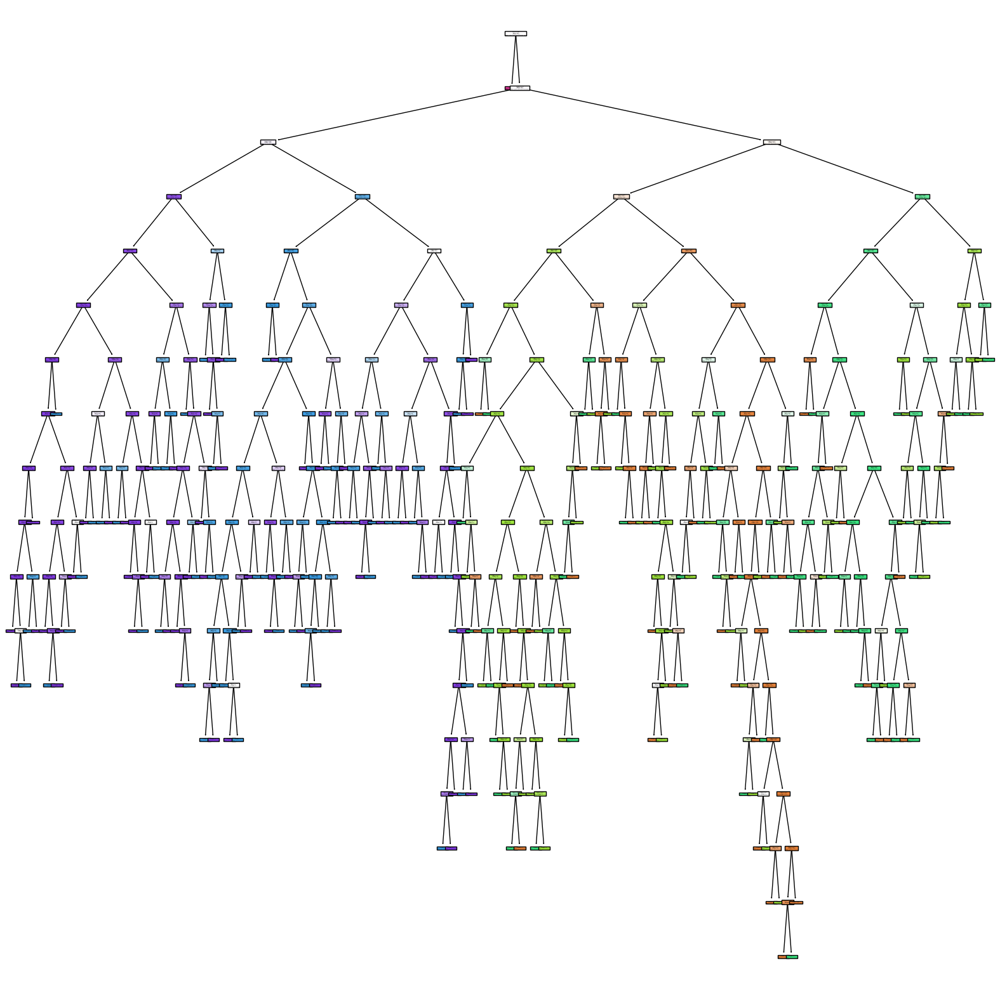

In [82]:
plt.figure(figsize = (20,20))
tree.plot_tree(tr, filled=True)
plt.show()

## Conclusion: 
    
In Logisitic Regression Algorithm our accuracy score = 97.7%

In K-Nearest Nighbours Algorithm our best accuracy score (n_neighbors=11) = 97%

In Naive Bayes Algorithm our accuracy score = 72.6%

In Decision Tree Algorithm our accuracy score = 92.4%


As we can see for this data set our best accuracy score coming from the Logisitic Regression & KNN which is 97%. 
That is more than enough to trust the Algorithm and the model and development of our system.